<a href="https://colab.research.google.com/github/kuanhsunwu/Vision-Based-Navigation-and-Learning-for-Autonomous-Vehicles-/blob/master/Yolov3_tiny.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from google.colab import drive
drive.mount('/drive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /drive


In [0]:
!nvidia -smi

/bin/bash: nvidia: command not found


In [0]:
!ln -fs /drive/My\ Drive/tiny /content/tiny

In [0]:
# copy the pretrained darknet bin file
import os
!cp /drive/My\ Drive/darknet /content/
assert os.path.isfile("/content/darknet"), 'Cannot copy from %s to /content' % (GDRIVE_DARKNET_BIN_FILE_PATH)

!chmod +x /content/darknet

In [0]:
!./darknet detector

./darknet: error while loading shared libraries: libcudart.so.10.0: cannot open shared object file: No such file or directory


In [0]:
!./darknet detector train tiny/tiny.data tiny/yolov3-tiny-voc.cfg tiny/one_class/yolov3-tiny-voc_2000.weights -dont_show  | grep "avg loss"


./darknet: error while loading shared libraries: libcudart.so.10.0: cannot open shared object file: No such file or directory


In [0]:
!./darknet detector map  tiny/tiny.data tiny/yolov3-tiny-voc.cfg tiny/one_class/yolov3-tiny-voc_8000.weights


layer     filters    size              input                output
   0 conv     16  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  16 0.319 BF
   1 max          2 x 2 / 2   608 x 608 x  16   ->   304 x 304 x  16 0.006 BF
   2 conv     32  3 x 3 / 1   304 x 304 x  16   ->   304 x 304 x  32 0.852 BF
   3 max          2 x 2 / 2   304 x 304 x  32   ->   152 x 152 x  32 0.003 BF
   4 conv     64  3 x 3 / 1   152 x 152 x  32   ->   152 x 152 x  64 0.852 BF
   5 max          2 x 2 / 2   152 x 152 x  64   ->    76 x  76 x  64 0.001 BF
   6 conv    128  3 x 3 / 1    76 x  76 x  64   ->    76 x  76 x 128 0.852 BF
   7 max          2 x 2 / 2    76 x  76 x 128   ->    38 x  38 x 128 0.001 BF
   8 conv    256  3 x 3 / 1    38 x  38 x 128   ->    38 x  38 x 256 0.852 BF
   9 max          2 x 2 / 2    38 x  38 x 256   ->    19 x  19 x 256 0.000 BF
  10 conv    512  3 x 3 / 1    19 x  19 x 256   ->    19 x  19 x 512 0.852 BF
  11 max          2 x 2 / 1    19 x  19 x 512   ->    19 x  19 x 512 0.001 

In [0]:
!./darknet detector test  tiny/tiny.data tiny/yolov3-tiny-voc.cfg tiny/one_class/yolov3-tiny-voc_final.weights tiny/img/data/00556.jpg


Cannot load image data/labels/32_0.png
Cannot load image data/labels/33_0.png
Cannot load image data/labels/34_0.png
Cannot load image data/labels/35_0.png
Cannot load image data/labels/36_0.png
Cannot load image data/labels/37_0.png
Cannot load image data/labels/38_0.png
Cannot load image data/labels/39_0.png
Cannot load image data/labels/40_0.png
Cannot load image data/labels/41_0.png
Cannot load image data/labels/42_0.png
Cannot load image data/labels/43_0.png
Cannot load image data/labels/44_0.png
Cannot load image data/labels/45_0.png
Cannot load image data/labels/46_0.png
Cannot load image data/labels/47_0.png
Cannot load image data/labels/48_0.png
Cannot load image data/labels/49_0.png
Cannot load image data/labels/50_0.png
Cannot load image data/labels/51_0.png
Cannot load image data/labels/52_0.png
Cannot load image data/labels/53_0.png
Cannot load image data/labels/54_0.png
Cannot load image data/labels/55_0.png
Cannot load image data/labels/56_0.png
Cannot load image data/la

fpath /content/tiny/img/data/00800.jpg


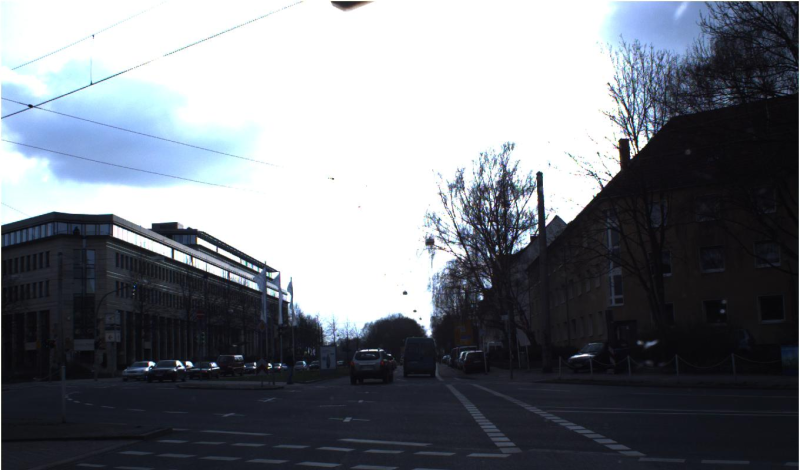

fpath /content/tiny/img/data/00804.jpg


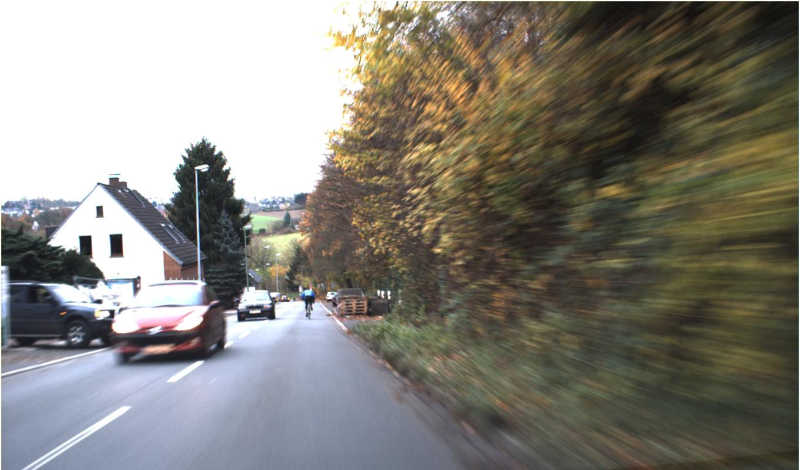

fpath /content/tiny/img/data/00803.jpg


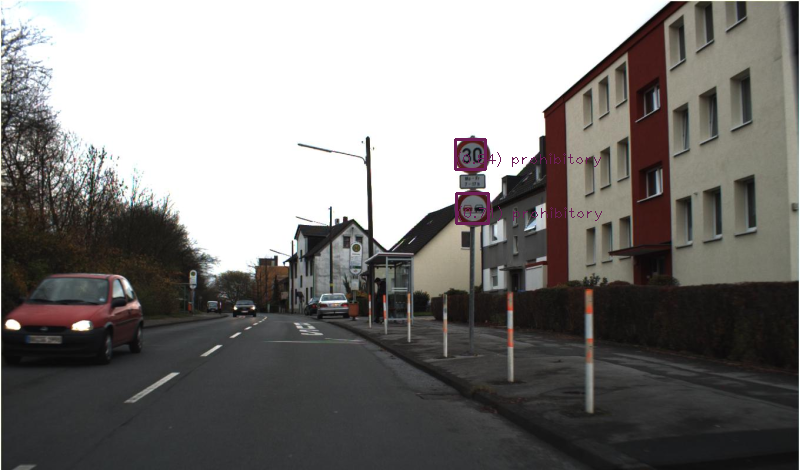

fpath /content/tiny/img/data/00801.jpg


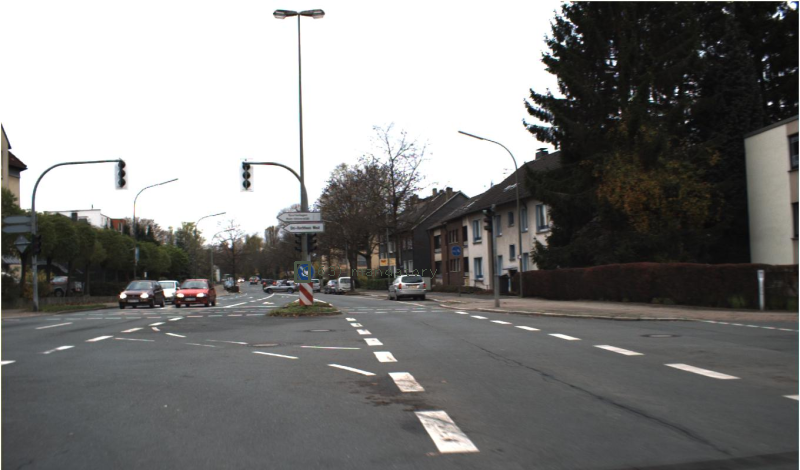

fpath /content/tiny/img/data/00802.jpg


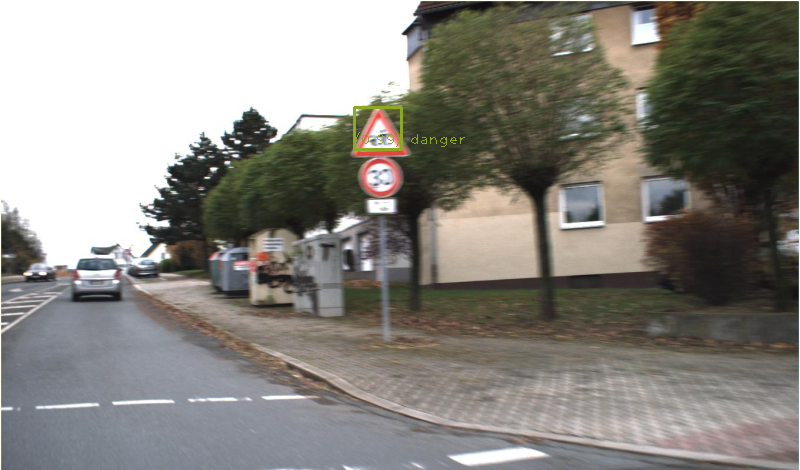

fpath /content/tiny/img/data/00805.jpg


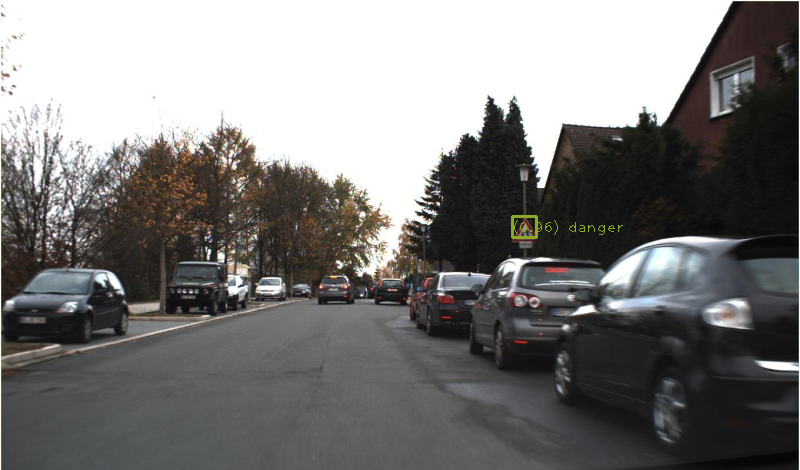

fpath /content/tiny/img/data/00806.jpg


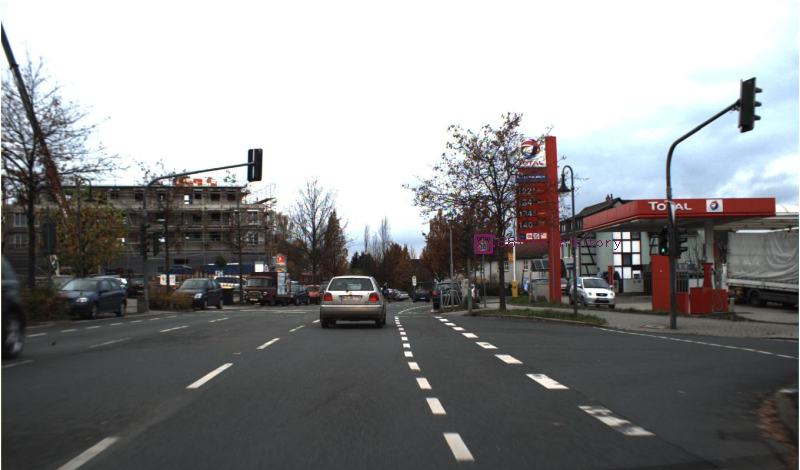

fpath /content/tiny/img/data/00807.jpg


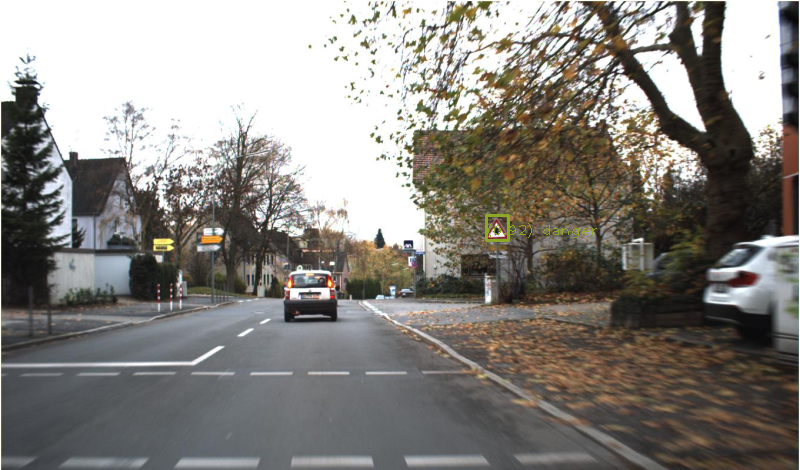

fpath /content/tiny/img/data/00808.jpg


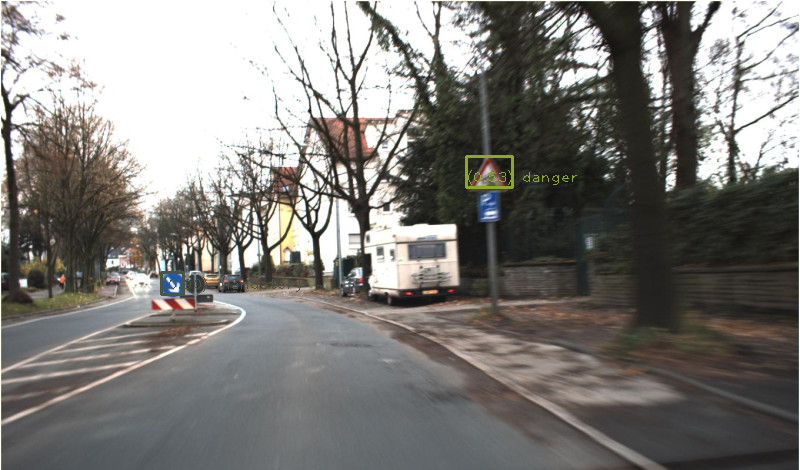

fpath /content/tiny/img/data/00810.jpg


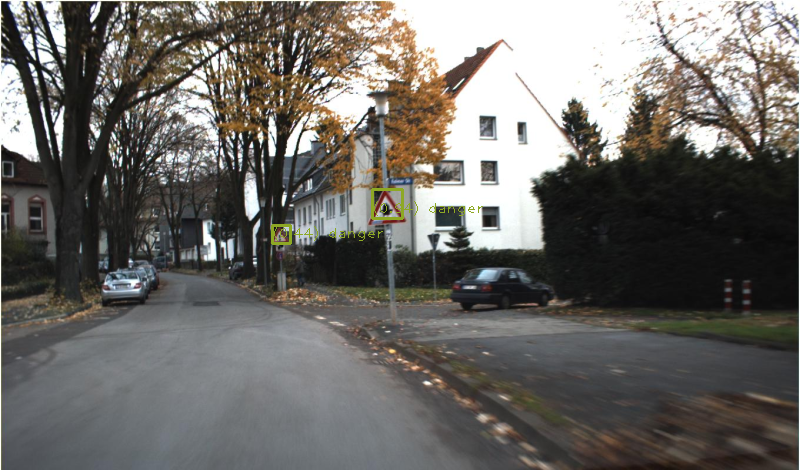

fpath /content/tiny/img/data/00809.jpg


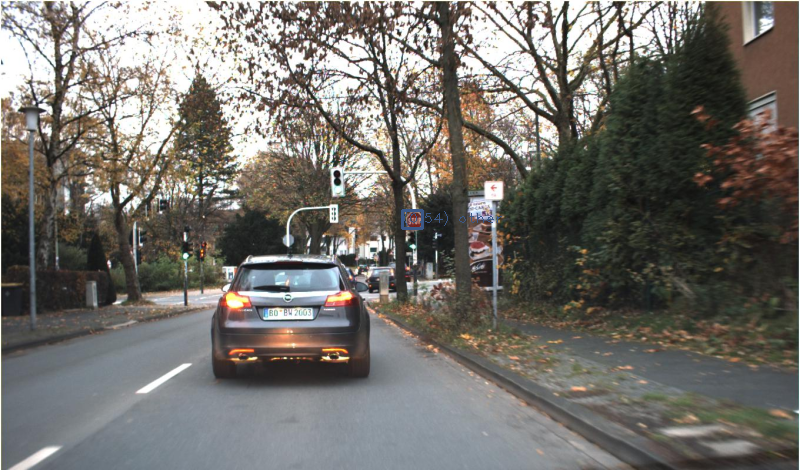

fpath /content/tiny/img/data/00812.jpg


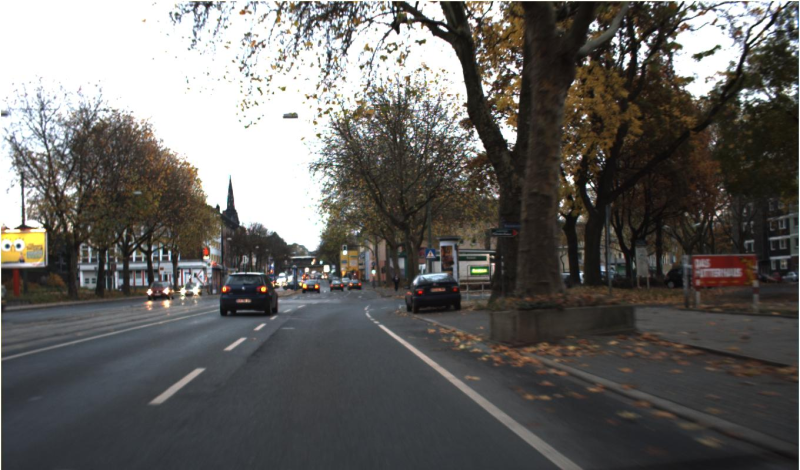

fpath /content/tiny/img/data/00811.jpg


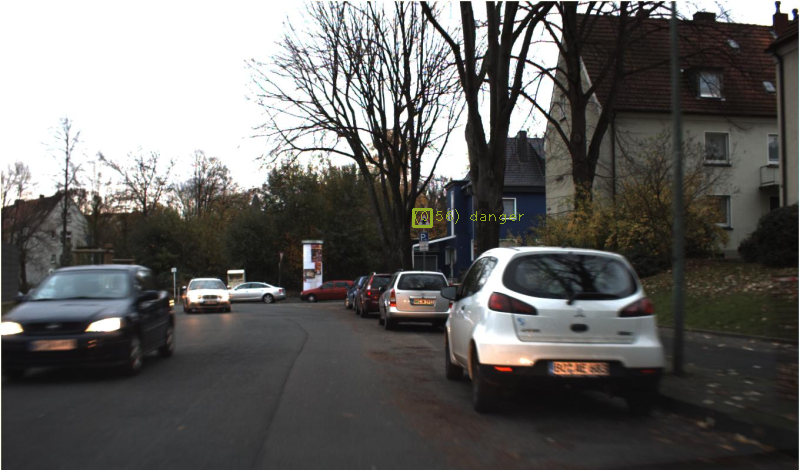

fpath /content/tiny/img/data/00813.jpg


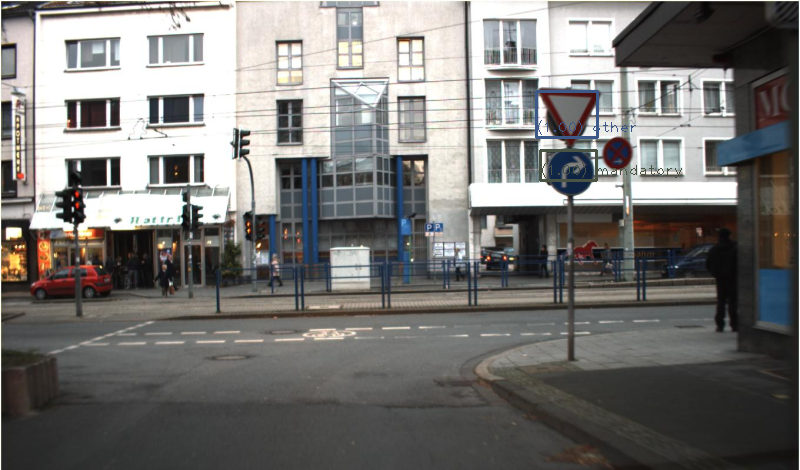

fpath /content/tiny/img/data/00814.jpg


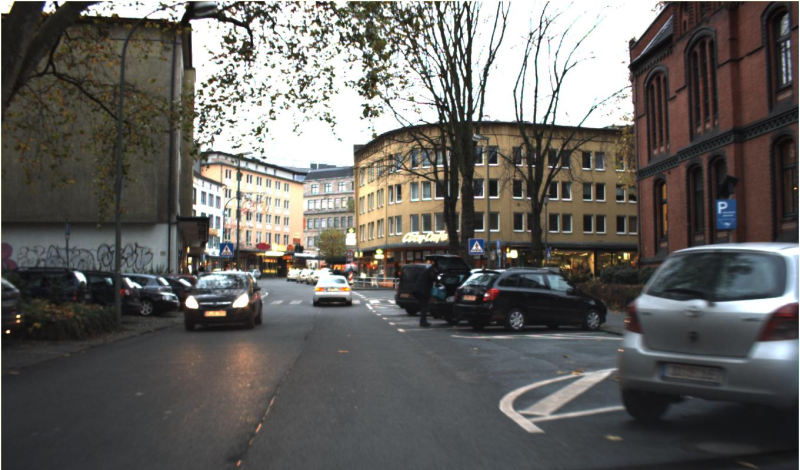

fpath /content/tiny/img/data/00815.jpg


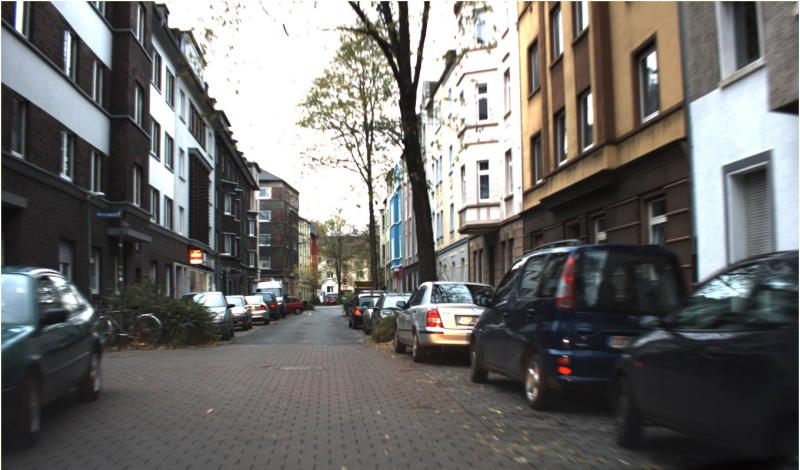

fpath /content/tiny/img/data/00816.jpg


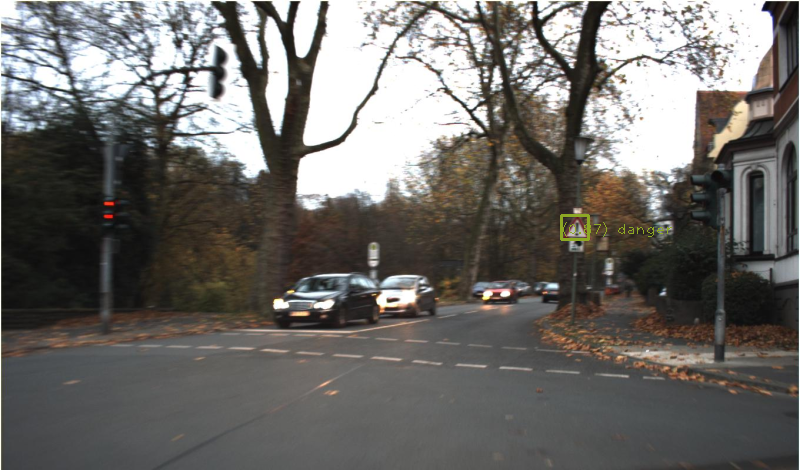

fpath /content/tiny/img/data/00817.jpg


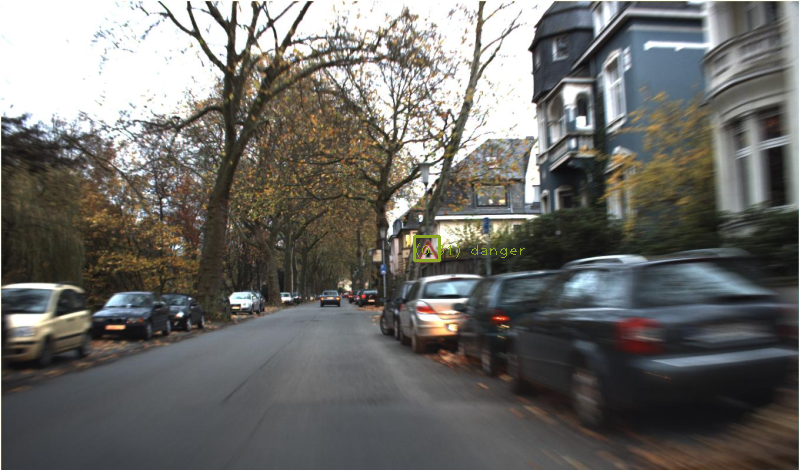

fpath /content/tiny/img/data/00818.jpg


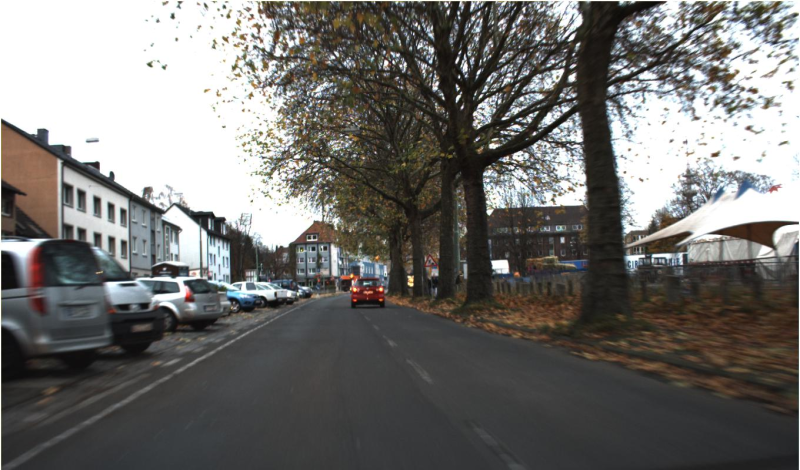

fpath /content/tiny/img/data/00819.jpg


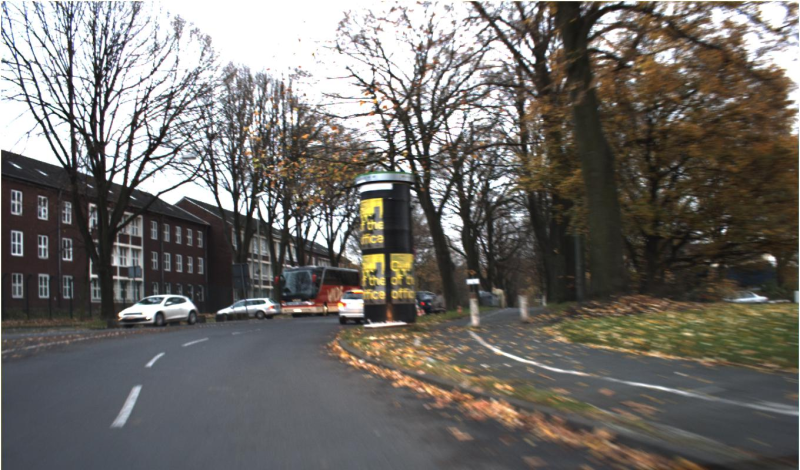

fpath /content/tiny/img/data/00821.jpg


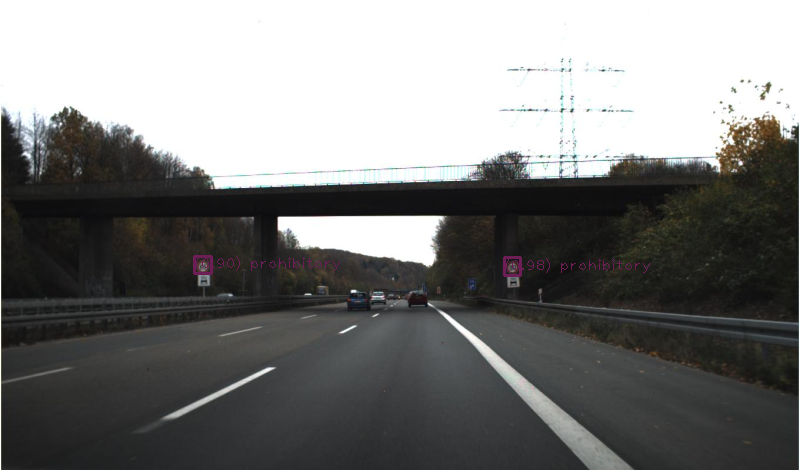

fpath /content/tiny/img/data/00820.jpg


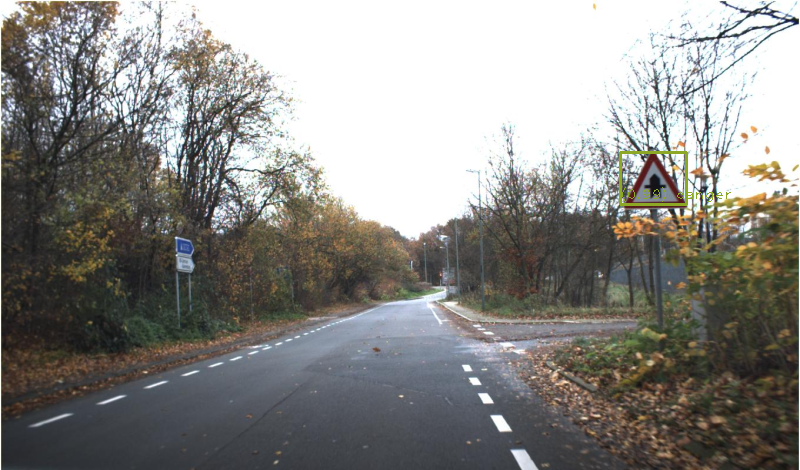

fpath /content/tiny/img/data/00822.jpg


KeyboardInterrupt: ignored

In [0]:
TO_DETECTING_IMAGE_DIR_PATH = "/content/tiny/img/data"

# Use python to read 

import os
import cv2
import numpy as np
import glob
from google.colab.patches import cv2_imshow

import pprint
pp = pprint.PrettyPrinter(indent=4)


def detecting_one_image(net, output_layers, img):
  # Detecting objects
  # cv::dnn::blobFromImage (InputArray image, double scalefactor=1.0, const Size &size=Size(), const Scalar &mean=Scalar(), bool swapRB=false, bool crop=false, int ddepth=CV_32F)
  blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
  net.setInput(blob)
  outs = net.forward(output_layers)

  return outs

# Load Yolo
net = cv2.dnn.readNet("/content/tiny/one_class/yolov3_last.weights", "/content/tiny/yolov3.cfg")
layer_names = net.getLayerNames()
output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]

# Load label names
with open("/content/tiny/voc.names", "r") as f:
  classes = [line.strip() for line in f.readlines()]

# Generate display colors
colors = np.random.uniform(0, 255, size=(len(classes), 3))

for fpath in glob.glob(os.path.join(TO_DETECTING_IMAGE_DIR_PATH, "*.jpg")):
  print("fpath", fpath)

  # Loading image
  img = cv2.imread(fpath)
  height, width, channels = img.shape

  if width>800: # resize for display purpose
    dim = (800, int(800*height/width))
    img = cv2.resize(img, dim, interpolation=cv2.INTER_AREA)
    height, width, channels = img.shape

  outs = detecting_one_image(net, output_layers, img)
  # Showing informations on the screen
  for out in outs:
    for detection in out:
      scores = detection[5:]
      class_id = np.argmax(scores)
      confidence = scores[class_id]
      if confidence > 0.3:
        # Object detected
        center_x = int(detection[0] * width)
        center_y = int(detection[1] * height)
        w = int(detection[2] * width)
        h = int(detection[3] * height)

        # Rectangle coordinates
        x = int(center_x - w / 2)
        y = int(center_y - h / 2)

        label = "(%.2f) %s" % (confidence, classes[class_id])

        cv2.rectangle(img, (x, y), (x + w, y + h), colors[class_id], 2)
        cv2.putText(img, label, (x, y+h-5), cv2.FONT_HERSHEY_PLAIN, 1, colors[class_id], 1)

  cv2_imshow(img)